In [2]:
# scientific computing libaries
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.decomposition import PCA
# data mining libaries
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA#, FastICA
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, GridSearchCV, learning_curve
from sklearn import svm
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
from imblearn.pipeline import make_pipeline, Pipeline
from imblearn.over_sampling import SMOTE
from sklearn import linear_model
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_predict
#plot libaries
import plotly
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True) # to show plots in notebook
from matplotlib import pyplot as plt
# online plotly
#from chart_studio.plotly import plot, iplot
from plotly.offline import plot,iplot
# offline plotly
#from plotly.offline import plot, iplot
from sklearn.metrics import mean_squared_error , make_scorer
from sklearn.metrics import r2_score
# do not show any warnings
import warnings
warnings.filterwarnings('ignore')

SEED = 17 # specify seed for reproducable results
pd.set_option('display.max_columns', None) # prevents abbreviation (with '...') of columns in prints


RANDOM_FOREST_PARAMS = {#bagging

    'clf__max_features': ['tutte'], # just sqrt is used because values of log2 and sqrt are very similar for our number of features (10-19) 

    'clf__n_estimators': [600,1000]
}

DECISION_TREE_PARAMS = {#dato pruing
    #tutti i parametri
            'cp':[1.07e-3,1.57e-3],
            'bin_bucket':[]
}

KNN_PARAMS = {
    'clf__n_neighbors': [7,7,14,14],
    'clf__weights': ['distance'],
}

SVM_PARAMS = [
{
    'clf__kernel': ['rbf'],
    'clf__C': [32,16],
    'clf__gamma': [0.8,0.8],
    'epsilon' :[1.4,0.6]
}]
def get_color_with_opacity(color, opacity):
    return "rgba(" + color[4:-1] + ", %.2f)" % opacity
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
# partially based on https://scikit-learn.org/stable/auto_examples/model_selection/plot_learning_curve.html
def plot_learning_curve(estimator, title, X, y, cv=None, n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Generate a simple plot of the test and training learning curve.

    Parameters
    ----------
    estimator : object type that implements the "fit" and "predict" methods
        An object of that type which is cloned for each validation.

    title : string
        Title for the chart.

    X : array-like, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.

    y : array-like, shape (n_samples) or (n_samples, n_features), optional
        Target relative to X for classification or regression;
        None for unsupervised learning.

    cv : int, cross-validation generator or an iterable, optional
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:
          - None, to use the default 3-fold cross-validation,
          - integer, to specify the number of folds.
          - :term:`CV splitter`,
          - An iterable yielding (train, test) splits as arrays of indices.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : int or None, optional (default=None)
        Number of jobs to run in parallel.
        ``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.
        ``-1`` means using all processors. See :term:`Glossary <n_jobs>`
        for more details.

    train_sizes : array-like, shape (n_ticks,), dtype float or int
        Relative or absolute numbers of training examples that will be used to
        generate the learning curve. If the dtype is float, it is regarded as a
        fraction of the maximum size of the training set (that is determined
        by the selected validation method), i.e. it has to be within (0, 1].
        Otherwise it is interpreted as absolute sizes of the training sets.
        Note that for classification the number of samples usually have to
        be big enough to contain at least one sample from each class.
        (default: np.linspace(0.1, 1.0, 5))
    """
    
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring="r2", random_state=SEED)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    trace1 = go.Scatter(
        x=train_sizes, 
        y=train_scores_mean - train_scores_std, 
        showlegend=False,
        mode="lines",
        name="",
        hoverlabel = dict(
            namelength=20
        ),
        line = dict(
            width = 0.1,
            color = get_color_with_opacity(colors[0], 0.4),
        ),
    )
    trace2 = go.Scatter(
        x=train_sizes, 
        y=train_scores_mean + train_scores_std, 
        showlegend=False,
        fill="tonexty",
        mode="lines",
        name="",
        hoverlabel = dict(
            namelength=20
        ),
        line = dict(
            width = 0.1,
            color = get_color_with_opacity(colors[0], 0.4),
        ),
    )
    trace3 = go.Scatter(
        x=train_sizes, 
        y=train_scores_mean, 
        showlegend=True,
        name="Train score",
        line = dict(
            color = colors[0],
        ),
    )
    
    trace4 = go.Scatter(
        x=train_sizes, 
        y=test_scores_mean - test_scores_std, 
        showlegend=False,
        mode="lines",
        name="",
        hoverlabel = dict(
            namelength=20
        ),
        line = dict(
            width = 0.1,
            color = get_color_with_opacity(colors[1], 0.4),
        ),
    )
    trace5 = go.Scatter(
        x=train_sizes, 
        y=test_scores_mean + test_scores_std, 
        showlegend=False,
        fill="tonexty",
        mode="lines",
        name="",
        hoverlabel = dict(
            namelength=20
        ),
        line = dict(
            width = 0.1,
            color = get_color_with_opacity(colors[1], 0.4),
        ),
    )
    trace6 = go.Scatter(
        x=train_sizes, 
        y=test_scores_mean, 
        showlegend=True,
        name="Test score",
        line = dict(
            color = colors[1],
        ),
    )
    
    data = [trace1, trace2, trace3, trace4, trace5, trace6]
    layout = go.Layout(
        title=title,
        autosize=True,
        yaxis=dict(
            title='R2 Score',
        ),
        xaxis=dict(
            title="#Training samples",
        ),
          legend=dict(
            x=0.8,
            y=0,
        ),
    )
    fig = go.Figure(data=data, layout=layout)
    return iplot(fig, filename=title)
def boxes():
    
    def create_box_churn_trace(col, visible=False):
        return go.Box(
            y=full_list[full_list['sex']==0][col],
            name='Men',
            marker = dict(color = colors[1]),
            visible=visible,
        )

    def create_box_no_churn_trace(col, visible=False):
        return go.Box(
            y=full_list[full_list['sex']==1][col],
            name='Women',
            marker = dict(color = colors[0]),
            visible = visible,
        )

    features_not_for_hist = ["subject#", "age", "sex",'test_time']
    features_for_box = [x for x in full_list.columns if x not in features_not_for_hist]
    # remove features with too less distinct values (e.g. binary features), because boxplot does not make any sense for them

    active_idx = 0
    box_traces_churn = [(create_box_churn_trace(col) if i != active_idx else create_box_churn_trace(col, visible=True)) for i, col in enumerate(features_for_box)]
    box_traces_no_churn = [(create_box_no_churn_trace(col) if i != active_idx else create_box_no_churn_trace(col, visible=True)) for i, col in enumerate(features_for_box)]
    data = box_traces_churn + box_traces_no_churn

    n_features = len(features_for_box)
    steps = []
    for i in range(n_features):
        step = dict(
            method = 'restyle',  
            args = ['visible', [False] * len(data)],
            label = features_for_box[i],
        )
        step['args'][1][i] = True # Toggle i'th trace to "visible"
        step['args'][1][i + n_features] = True # Toggle i'th trace to "visible"
        steps.append(step)

    sliders = [dict(
        active = active_idx,
        currentvalue = dict(
            prefix = "Feature: ", 
            xanchor= 'center',
        ),
        pad = {"t": 50},
        steps = steps,
        len=1,
    )]

    layout = dict(
        sliders=sliders,
        yaxis=dict(
            title='value',
            automargin=True,
        ),
        legend=dict(
            x=0,
            y=1,
        ),
    )

    fig = dict(data=data, layout=layout)

    iplot(fig, filename='box_slider')
def hists():
    def create_box_churn_trace(col, visible=False):
        return go.Histogram(
            x=full_list[col],
            marker = dict(color = colors[0]),
            visible=visible,
        )

    def create_box_no_churn_trace(col, visible=False):
        return go.Histogram(
            x=full_list[col],
            marker = dict(color = colors[0]),
            visible =False,
        )

    features_not_for_hist = ["subject#", "age", "sex",'test_time']
    features_for_box = [x for x in full_list.columns if x not in features_not_for_hist]
    # remove features with too less distinct values (e.g. binary features), because boxplot does not make any sense for them

    active_idx = 0
    box_traces_churn = [(create_box_churn_trace(col) if i != active_idx else create_box_churn_trace(col, visible=True)) for i, col in enumerate(features_for_box)]
    box_traces_no_churn = [(create_box_no_churn_trace(col) if i != active_idx else create_box_no_churn_trace(col, visible=True)) for i, col in enumerate(features_for_box)]
    data = box_traces_churn + box_traces_no_churn

    n_features = len(features_for_box)
    steps = []
    for i in range(n_features):
        step = dict(
            method = 'restyle',  
            args = ['visible', [False] * len(data)],
            label = features_for_box[i],
        )
        step['args'][1][i] = True # Toggle i'th trace to "visible"
        step['args'][1][i + n_features] = True # Toggle i'th trace to "visible"
        steps.append(step)

    sliders = [dict(
        active = active_idx,
        currentvalue = dict(
            prefix = "Feature: ", 
            xanchor= 'center',
        ),
        pad = {"t": 50},
        steps = steps,
        len=1,
    )]

    layout = dict(
        sliders=sliders,
        yaxis=dict(
            title='value',
            automargin=True,
        ),
    )

    fig = dict(data=data, layout=layout)

    iplot(fig, filename='box_slider')
    def create_box_churn_trace(col, visible=False):
        return go.Histogram(
            x=full_list[full_list['sex']==0][col],
            name='Men',
            marker = dict(color = colors[1]),
            visible=visible,
        )

    def create_box_no_churn_trace(col, visible=False):
        return go.Histogram(
            x=full_list[full_list['sex']==1][col],
            name='Women',
            marker = dict(color = colors[0]),
            visible = visible,
        )

    features_not_for_hist = ["subject#", "age", "sex",'test_time']
    features_for_box = [x for x in full_list.columns if x not in features_not_for_hist]
    # remove features with too less distinct values (e.g. binary features), because boxplot does not make any sense for them

    active_idx = 0
    box_traces_churn = [(create_box_churn_trace(col) if i != active_idx else create_box_churn_trace(col, visible=True)) for i, col in enumerate(features_for_box)]
    box_traces_no_churn = [(create_box_no_churn_trace(col) if i != active_idx else create_box_no_churn_trace(col, visible=True)) for i, col in enumerate(features_for_box)]
    data = box_traces_churn + box_traces_no_churn

    n_features = len(features_for_box)
    steps = []
    for i in range(n_features):
        step = dict(
            method = 'restyle',  
            args = ['visible', [False] * len(data)],
            label = features_for_box[i],
        )
        step['args'][1][i] = True # Toggle i'th trace to "visible"
        step['args'][1][i + n_features] = True # Toggle i'th trace to "visible"
        steps.append(step)

    sliders = [dict(
        active = active_idx,
        currentvalue = dict(
            prefix = "Feature: ", 
            xanchor= 'center',
        ),
        pad = {"t": 50},
        steps = steps,
        len=1,
    )]

    layout = dict(
        sliders=sliders,
        yaxis=dict(
            title='value',
            automargin=True,
        ),
        legend=dict(
            x=0,
            y=1,
        ),
    )

    fig = dict(data=data, layout=layout)

    iplot(fig, filename='box_slider')
from itertools import combinations
def scatter_patient(df, subject_list, columns, patient_filter, scatter_alpha=0.3):
    fig, ax = plt.subplots(figsize=(30,22))
    f = [comb for comb in combinations(range(len(columns)), 2)]
    
    for _, fp, _ in patient_filter:
        fp = fp & subject_list
        
    for i in range(len(f)):
        plt.subplot(5,5,i + 1)
        column_1 = columns[f[i][0]]
        column_2 = columns[f[i][1]]
        
        for name, fp, color in patient_filter:
            plt.scatter(df[fp][column_1], df[fp][column_2], alpha=scatter_alpha, marker='.', color=color, s=5, label=name)
        
        plt.xlabel(column_1)
        plt.ylabel(column_2)
        if(i == 0 or i == len(f)):
            plt.legend(markerscale=5, framealpha=1)
import numpy as np
def age():
    
    age = go.Histogram(
            x=full_list.groupby(by=['subject#','age','sex']).max().reset_index()['age'],
            name='Age Dist',
            xbins=dict(
            start=36,
            end=85,
            size=1
        ),
            visible=True,
        )
    fig = dict(data=age)

    iplot(fig, filename='box_slider')


In [3]:
full_list_original = pd.read_table('parkinsons_updrs.data',delimiter=',')
full_list_original

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,28.199,34.398,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,28.447,34.894,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,28.695,35.389,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,28.905,35.810,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,29.187,36.375,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5870,42,61,0,142.7900,22.485,33.485,0.00406,0.000031,0.00167,0.00168,0.00500,0.01896,0.160,0.00973,0.01133,0.01549,0.02920,0.025137,22.369,0.64215,0.55314,0.21367
5871,42,61,0,149.8400,21.988,32.988,0.00297,0.000025,0.00119,0.00147,0.00358,0.02315,0.215,0.01052,0.01277,0.01904,0.03157,0.011927,22.886,0.52598,0.56518,0.12621
5872,42,61,0,156.8200,21.495,32.495,0.00349,0.000025,0.00152,0.00187,0.00456,0.02499,0.244,0.01371,0.01456,0.01877,0.04112,0.017701,25.065,0.47792,0.57888,0.14157
5873,42,61,0,163.7300,21.007,32.007,0.00281,0.000020,0.00128,0.00151,0.00383,0.01484,0.131,0.00693,0.00870,0.01307,0.02078,0.007984,24.422,0.56865,0.56327,0.14204


In [4]:
full_list_original = pd.read_table('parkinsons_updrs.data',delimiter=',')
full_list_original

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,28.199,34.398,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,28.447,34.894,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,28.695,35.389,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,28.905,35.810,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,29.187,36.375,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5870,42,61,0,142.7900,22.485,33.485,0.00406,0.000031,0.00167,0.00168,0.00500,0.01896,0.160,0.00973,0.01133,0.01549,0.02920,0.025137,22.369,0.64215,0.55314,0.21367
5871,42,61,0,149.8400,21.988,32.988,0.00297,0.000025,0.00119,0.00147,0.00358,0.02315,0.215,0.01052,0.01277,0.01904,0.03157,0.011927,22.886,0.52598,0.56518,0.12621
5872,42,61,0,156.8200,21.495,32.495,0.00349,0.000025,0.00152,0.00187,0.00456,0.02499,0.244,0.01371,0.01456,0.01877,0.04112,0.017701,25.065,0.47792,0.57888,0.14157
5873,42,61,0,163.7300,21.007,32.007,0.00281,0.000020,0.00128,0.00151,0.00383,0.01484,0.131,0.00693,0.00870,0.01307,0.02078,0.007984,24.422,0.56865,0.56327,0.14204


This dataset is composed of a range of biomedical voice measurements from 42 
people with early-stage Parkinson's disease recruited to a six-month trial of 
a telemonitoring device for remote symptom progression monitoring. The 
recordings were automatically captured in the patient's homes.

Columns in the table contain subject number, subject age, subject gender, 
time interval from baseline recruitment date, motor UPDRS, total UPDRS, and 
16 biomedical voice measures. Each row corresponds to one of 5,875 voice 
recording from these individuals. The main aim of the data is to predict the 
motor and total UPDRS scores ('motor_UPDRS' and 'total_UPDRS') from the 16 
voice measures.

subject# - Integer that uniquely identifies each subject

age - Subject age

sex - Subject gender '0' - male, '1' - female

test_time - Time since recruitment into the trial. The integer part is the 
number of days since recruitment.

motor_UPDRS - Clinician's motor UPDRS score, linearly interpolated

total_UPDRS - Clinician's total UPDRS score, linearly interpolated

Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP - Several measures of 
variation in fundamental frequency 

Jitter (absolute) is the cycle-to-cycle variation of
fundamental frequency, i.e. the average absolute
difference between consecutive periods, expressed as: 

Jitter (%) is the average absolute difference between
consecutive periods, divided by the average period. It is
expressed as a percentage: 

Jitter (rap) is defined as the Relative Average
Perturbation, the average absolute difference between a
period and the average of it and its two neighbours,
divided by the average period. 

Jitter (ppq5) is the five-point Period Perturbation
Quotient, computed as the average absolute difference
between a period and the average of it and its four closest
neighbours, divided by the average period. 

Jitter (DDP) is the average absolute difference between consecutive differences between consecutive periods, divided by the average period

Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA - 
Several measures of variation in amplitude

Shimmer (dB) is expressed as the variability of the peakto-peak amplitude in decibels, i.e. the average absolute
base-10 logarithm of the difference between the
amplitudes of consecutive periods, multiplied by 20: 

Shimmer (relative) is defined as the average absolute
difference between the amplitudes of consecutive periods,
divided by the average amplitude, expressed as a
percentage: 

Shimmer (apq3) is the three-point Amplitude Perturbation
Quotient, the average absolute difference between the
amplitude of a period and the average of the amplitudes of
its neighbours, divided by the average amplitude. 

Shimmer (apq5) is defined as the five-point Amplitude
Perturbation Quotient, the average absolute difference
between the amplitude of a period and the average of the
amplitudes of it and its four closest neighbours, divided
by the average amplitude.

Shimmer (apq11) is expressed as the 11-point Amplitude
Perturbation Quotient, the average absolute difference
between the amplitude of a period and the average of the
amplitudes of it and its ten closest neighbours, divided by
the average amplitude. 

Shimmer(DDA) is anverage absolute difference between consecutive differences between the amplitudes of consecutive periods

NHR,HNR - Two measures of ratio of noise to tonal components in the voice

Noise-to-Harmonics Ratio 
Harmonics-to-Noise Ratio 

RPDE - A nonlinear dynamical complexity measure

DFA - Signal fractal scaling exponent (https://pdfs.semanticscholar.org/1410/8c3de76218d8f8cb628d5888110e94de6b78.pdf)

PPE - A nonlinear measure of fundamental frequency variation 

In [5]:
full_list = pd.concat([np.log10(full_list_original[['Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP', 'Jitter:PPQ5',
       'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'Shimmer:APQ11', 'NHR', 'RPDE','PPE']]),full_list_original[['subject#','age','sex','test_time', 'DFA','HNR','motor_UPDRS','total_UPDRS']]],axis = 1)

Shimmer(DDA) and Jitter(DDP) will not be used for the analysis because they are proportional to two other dimensions(DDA = 3*APQ3,DDP=3*RAP).

In [6]:
pd.merge(full_list[['sex','subject#']].drop_duplicates().groupby(by=['sex']).count().reset_index(),full_list[['sex','subject#','age']].drop_duplicates().groupby(by=['sex']).mean().reset_index()[['sex','age']]).rename(columns={'subject#':'count','age':'avg_age'})

,sex,count,avg_age
0,0,28,64.821429
1,1,14,63.571429


In [7]:
full_list[['sex','subject#','age']].drop_duplicates().groupby(by=['sex']).mean().reset_index()[['sex','age']]

,sex,age
0,0,64.821429
1,1,63.571429


In [8]:
corr = full_list.corr()
trace = go.Heatmap(z=corr.values.tolist(), x=corr.columns, y=corr.columns)
data=[trace]
layout = go.Layout(
    title='Heatmap of pairwise correlation of the columns',
    autosize=False,
    width=850,
    height=700,
    yaxis=go.layout.YAxis(automargin=True),
    xaxis=dict(tickangle=40),
    margin=go.layout.Margin(l=0, r=200, b=200, t=80)
)


fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='labelled-heatmap1')

In [9]:
from scipy.cluster import hierarchy as hc
X = np.random.rand(10, 10)
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
names = full_list[['Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP', 'Jitter:PPQ5', 'Shimmer',
       'Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5', 'Shimmer:APQ11', 'NHR',
       'RPDE', 'PPE', 'age', 'sex', 'DFA', 'HNR',
       'motor_UPDRS', 'total_UPDRS']].columns
inverse_correlation = 1 - abs(full_list[['Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP', 'Jitter:PPQ5', 'Shimmer',
       'Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5', 'Shimmer:APQ11', 'NHR',
       'RPDE', 'PPE', 'age', 'sex', 'DFA', 'HNR',
       'motor_UPDRS', 'total_UPDRS']].corr())
fig = ff.create_dendrogram(inverse_correlation.values, orientation='left', labels=names, colorscale=colors, linkagefun=lambda x: hc.linkage(x, 'average'))
fig['layout'].update(dict(
    title="Dendrogram of clustering the features according to correlation",
    width=800, 
    height=600,
    margin=go.layout.Margin(l=180, r=50),
    xaxis=dict(
        title='distance',
    ),
    yaxis=dict(
        title='features',
        automargin=True,
    ),
))
iplot(fig, filename='dendrogram_corr_clustering')

In [97]:
boxes()

In [98]:
hists()

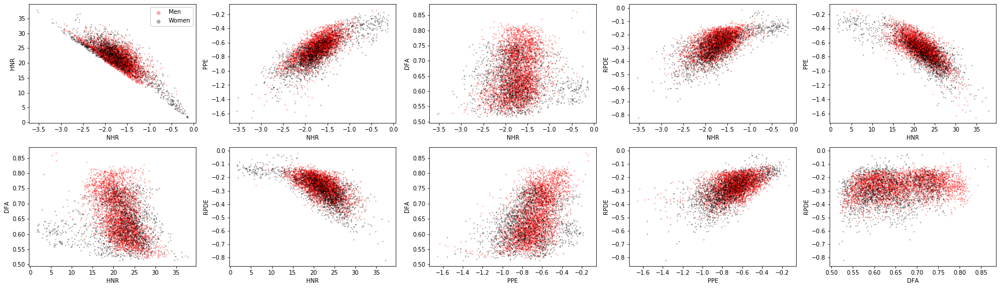

In [99]:
sex_filter_patient = [('Men', full_list['sex'] == 0, 'red'), 
                      ('Women', full_list['sex'] == 1, 'black')]
scatter_patient(full_list, full_list['subject#'] == full_list['subject#'], ['NHR', 'HNR', 'PPE', 'DFA', 'RPDE'], sex_filter_patient)

In [100]:
age()

# PCA

Principal Component Analysis (PCA) is a dimensionality reduction technique. Given a dataset with samples and a vector of features per sample, it allows us to create new features to describe the samples in such a way that:

-the new features are linear combinations of the old ones

-the new features are not correlated with each other

In [47]:
df_y_total = full_list["total_UPDRS"]
df_y_motor = full_list["motor_UPDRS"]
df_X = full_list.drop(["motor_UPDRS","total_UPDRS"], axis=1)

df_X_fra = df_X.drop(["subject#","age",'sex','test_time'], axis=1)
df_X_age = df_X[["age",'sex','DFA']]
# calculate the principal components
df_X_fra=df_X_fra[['Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP', 'Jitter:PPQ5',
       'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'Shimmer:APQ11', 'NHR','HNR', 'RPDE', 'DFA', 'PPE' ]]
df_X_normed_fra = StandardScaler().fit_transform(df_X_fra.drop(['DFA'],axis = 1))
pca = PCA()
df_X_pca = pca.fit_transform(df_X_normed_fra)
tot = sum(pca.explained_variance_) # total explained variance of all principal components
var_exp = [(i / tot) * 100 for i in sorted(pca.explained_variance_, reverse=True)] # individual explained variance
cum_var_exp = np.cumsum(var_exp) # cumulative explained variance


n_components = 4
df_X_reduced = np.dot(df_X_normed_fra, pca.components_[:n_components,:].T)
df_X_reduced = pd.DataFrame(df_X_reduced, columns=["PC#%d" % (x + 1) for x in range(n_components)])
trace_cum_var_exp = go.Bar(
    x=list(range(1, len(cum_var_exp) + 1)), 
    y=var_exp,
    name="individual explained variance",
)
trace_ind_var_exp = go.Scatter(
    x=list(range(1, len(cum_var_exp) + 1)),
    y=cum_var_exp,
    mode='lines+markers',
    name="cumulative explained variance",
    line=dict(
        shape='hv',
    ))
data = [trace_cum_var_exp, trace_ind_var_exp]
layout = go.Layout(
    title='Individual and Cumulative Explained Variance',
    autosize=True,
    yaxis=dict(
        title='percentage of explained variance',
    ),
    xaxis=dict(
        title="principal components",
        dtick=1,
    ),
    legend=dict(
        x=0,
        y=1,
    ),
)
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='basic-bar')



numerical = ['Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP', 'Jitter:PPQ5',
       'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'Shimmer:APQ11', 'NHR','HNR', 'RPDE', 'DFA', 'PPE' ]
# X =df_X_pca[:,0:5]
X = pd.concat((df_X_reduced,df_X_age),axis = 1)
targets_motor = full_list[['motor_UPDRS']]
targets_total = full_list[['total_UPDRS']]


y_motor = targets_motor
y_total = targets_total
input_width = X.shape[1]
print(input_width)

from sklearn.model_selection import train_test_split
#original data
X_train_motor_original, X_test_motor_original, y_train_motor_original, y_test_motor_original = train_test_split(pd.concat((full_list[numerical] ,df_X_age),axis = 1), y_motor, train_size=0.8, random_state=4422)

X_train_total_original, X_test_total_original, y_train_total_original, y_test_total_original = train_test_split(pd.concat((full_list[numerical] ,df_X_age),axis = 1), y_total, train_size=0.8, random_state=4422)
#pca data

X_train_motor, X_test_motor, y_train_motor, y_test_motor = train_test_split(X, y_motor, train_size=0.8, random_state=4422)

X_train_total, X_test_total, y_train_total, y_test_total = train_test_split(X, y_total, train_size=0.8, random_state=4422)

7


# PCR e PLS

Partial least squares and the closely related principal component regression technique are both
designed to handle the case of a large number of correlated independent variables.

To understand partial least squares, it helps to first get a handle on principal
component regression, which we now cover.

The idea behind principal component regression is to first perform a principal component
analysis (PCA) on the design matrix and then use only the first k principal components to do the
regression

The idea behind Partial Least Squares is to decompose both the design matrix X and response matrix Y (we consider the general case of multiple
responses here) like in principal component analysis:
X = TP' Y = UQ'
and then perform regression between T and U.
We will apply the same technique used on a regular PCA on the the covariance matrix Y'X (http://users.cecs.anu.edu.au/~kee/pls.pdf) 

In [14]:
def pcr(X,y,pc):

# Define the PCA object
    n_components = pc
    df_X_reduced = np.dot(df_X_normed_fra, pca.components_[:n_components,:].T)
    df_X_reduced = pd.DataFrame(df_X_reduced, columns=["PC#%d" % (x + 1) for x in range(n_components)])
    Xreg = pd.concat((df_X_reduced,df_X_age),axis = 1)
    ''' Step 2: regression on selected principal components'''
    # Create linear regression object
    regr = linear_model.LinearRegression()
    # Fit
    regr.fit(Xreg, y)
    # Calibration
    y_c = regr.predict(Xreg)
    # Cross-validation
    y_cv = cross_val_predict(regr, Xreg, y, cv=10)
    # Calculate scores for calibration and cross-validation
    score_c = r2_score(y, y_c)
    score_cv = r2_score(y, y_cv)
    # Calculate mean square error for calibration and cross validation
    mse_c = mean_squared_error(y, y_c)
    mse_cv = mean_squared_error(y, y_cv)
    return(y_cv, score_c, score_cv, mse_c, mse_cv)
r2r_list = []
r2cv_list = []
mser_list = []
mscv_list = []
for pc in range(1,14):
    predicted, r2r, r2cv, mser, mscv = pcr(df_X_reduced,y_motor,pc)
    r2r_list.append(r2r)
    r2cv_list.append(r2cv)
    mser_list.append(mser)
    mscv_list.append(mscv)

In [15]:
import plotly.graph_objects as go
x = np.arange(1,14)
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=r2r_list,name='R2'))
fig.add_trace(go.Scatter(x=x, y=r2cv_list,name='R2 validation'))
fig.show()

fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=mser_list,name='MSE'))
fig.add_trace(go.Scatter(x=x, y=mscv_list,name='MSE validation'))
fig.show()

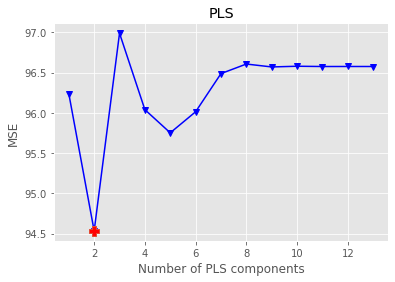

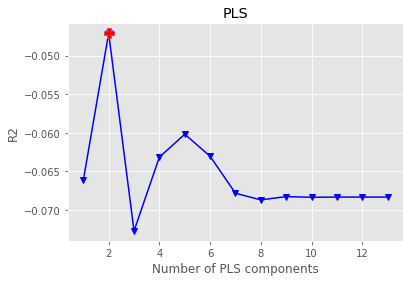

In [22]:
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_squared_error, r2_score
def optimise_pls_cv(X, y, n_comp):
    # Define PLS object
    pls = PLSRegression(n_components=n_comp)

    # Cross-validation
    y_cv = cross_val_predict(pls, X, y, cv=10)

    # Calculate scores
    r2 = r2_score(y, y_cv)
    mse = mean_squared_error(y, y_cv)
    rpd = y.std()/np.sqrt(mse)
    
    return (y_cv, r2, mse, rpd)
# test with 40 components
r2s = []
mses = []
rpds = []

n_components = 13
xticks = np.arange(1, n_components+1)
df_X_reduced = np.dot(df_X_normed_fra, pca.components_[:n_components,:].T)
df_X_reduced = pd.DataFrame(df_X_reduced, columns=["PC#%d" % (x + 1) for x in range(n_components)])
Xreg = pd.concat((df_X_reduced,df_X_age),axis = 1)
X2, y = Xreg, full_list[['motor_UPDRS','total_UPDRS']]
for n_comp in xticks:
    y_cv, r2, mse, rpd = optimise_pls_cv(X2, y, n_comp)
    r2s.append(r2)
    mses.append(mse)
    rpds.append(rpd)
def plot_metrics(vals, ylabel, objective):
    with plt.style.context('ggplot'):
        plt.plot(xticks, np.array(vals), '-v', color='blue', mfc='blue')
        if objective=='min':
            idx = np.argmin(vals)
        else:
            idx = np.argmax(vals)
        plt.plot(xticks[idx], np.array(vals)[idx], 'P', ms=10, mfc='red')

        plt.xlabel('Number of PLS components')
        plt.xticks = xticks
        plt.ylabel(ylabel)
        plt.title('PLS')

    plt.show()
plot_metrics(mses, 'MSE', 'min')
#plot_metrics(rpds, 'RPD', 'max')
plot_metrics(r2s, 'R2', 'max')



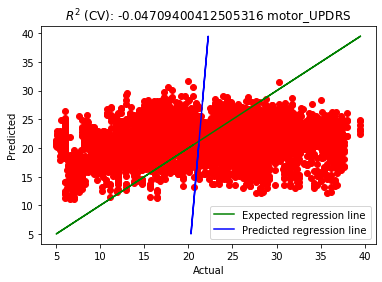

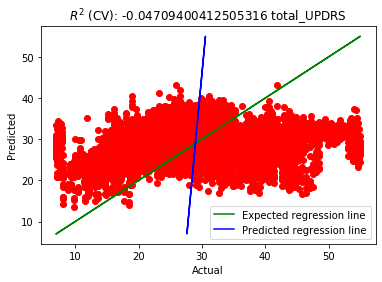

In [41]:
y_cv, r2, mse, rpd = optimise_pls_cv(X2, y, 2)
for i in range(2):
    plt.scatter(y.iloc[:,i], y_cv[:,i], color='red')
    plt.plot(y.iloc[:,i], y.iloc[:,i], '-g', label='Expected regression line')
    z = np.polyfit(y.iloc[:,i], y_cv[:,i], 1)
    plt.plot(np.polyval(z, y.iloc[:,i]), y.iloc[:,i], color='blue', label='Predicted regression line')
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('$R^{2}$ (CV): '+str(r2)+' '+str(y.columns[i]))
    plt.legend()
    plt.show()
    

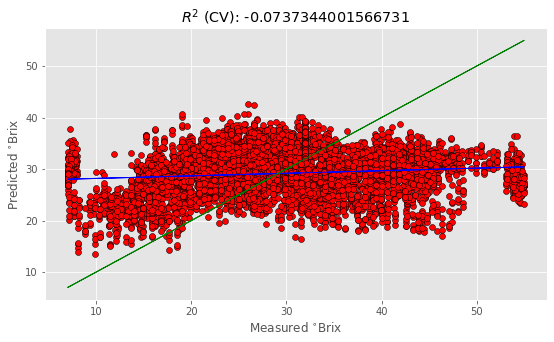

In [106]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_squared_error, r2_score
def pcr_graph():
    regr = linear_model.LinearRegression()
    n_components = pc
    df_X_reduced = np.dot(df_X_normed_fra, pca.components_[:n_components,:].T)
    df_X_reduced = pd.DataFrame(df_X_reduced, columns=["PC#%d" % (x + 1) for x in range(n_components)])
    Xreg = pd.concat((df_X_reduced,df_X_age),axis = 1)
    # Fit
    regr.fit(Xreg, y_total)
    # Calibration
    y_c = regr.predict(Xreg)
    # Cross-validation
    y_cv = cross_val_predict(regr, Xreg, y_total, cv=10)
    # Calculate scores for calibration and cross-validation
    score_c = r2_score(y_total, y_c)
    score_cv = r2_score(y_total, y_cv)
    # Calculate mean square error for calibration and cross validation
    mse_c = mean_squared_error(y_total, y_c)
    mse_cv = mean_squared_error(y_total, y_cv)
    predicted, r2r, r2cv, mser, mscv = y_cv, score_c, score_cv, mse_c, mse_cv
    z = np.polyfit( np.array(y_total['total_UPDRS']),predicted, 1)
    with plt.style.context(('ggplot')):
        fig, ax = plt.subplots(figsize=(9, 5))
        ax.scatter(y_total, predicted, c='red', edgecolors='k')
        ax.plot(y, z[1]+z[0]*y, c='blue', linewidth=1)
        ax.plot(y, y, color='green', linewidth=1)
        plt.title('$R^{2}$ (CV): '+str(r2cv))
        plt.xlabel('Measured $^{\circ}$Brix')
        plt.ylabel('Predicted $^{\circ}$Brix')
        plt.show()
pcr_graph()

In [64]:
from pca import pca
model = pca(n_components=0.95)

# Or reduce the data towards 2 PCs


# Fit transform

df = StandardScaler().fit_transform(df_X_fra.drop(['DFA'],axis = 1))

df = pd.DataFrame(df, columns=[x for x in df_X_fra.drop(['DFA'],axis = 1)])
results = model.fit_transform(df)
# Make biplot with the number of features
fig, ax = model.biplot(n_feat=4)


[pca] >The PCA reduction is performed on the [13] columns of the input dataframe.
[pca] >Processing dataframe..
[pca] >Fitting using PCA..
[pca] >Computing loadings and PCs..
[pca] >Computing explained variance..
[pca] >Number of components is [4] that covers the [95.00%] explained variance.


ValueError: Image size of 608x88163 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 720x576 with 1 Axes>

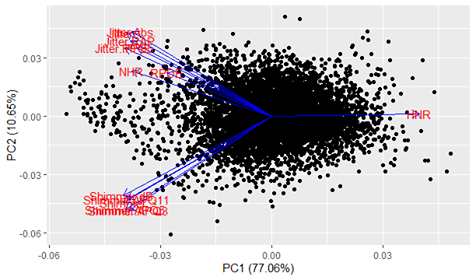

In [66]:
from IPython.display import Image
Image(filename='pca.png')

In [54]:
pca.components_

array([[ 2.85612419e-01,  2.74543948e-01,  2.76932088e-01,
         2.88811312e-01,  2.90975019e-01,  2.91955489e-01,
         2.80866537e-01,  2.86044835e-01,  2.83779309e-01,
         2.74240002e-01, -2.90615761e-01,  2.06149030e-01,
         2.63898588e-01],
       [-3.10005000e-01, -3.17695059e-01, -2.80113178e-01,
        -2.54212262e-01,  3.24302828e-01,  2.98863829e-01,
         3.54964118e-01,  3.49898386e-01,  3.13858376e-01,
        -1.66689526e-01, -7.86602475e-03, -1.60520799e-01,
        -2.54632845e-01],
       [ 2.01474558e-01, -2.70242389e-02,  3.16705425e-01,
         2.37107744e-01,  2.89483433e-02,  4.49599585e-02,
         8.63842667e-02,  3.47863131e-02, -5.65308178e-02,
        -1.09418146e-01,  1.32909279e-01, -8.70477014e-01,
         7.77040151e-03],
       [ 6.22079182e-02, -1.88632914e-01,  1.85600555e-01,
         1.86301956e-02, -7.75057268e-04,  2.54338048e-02,
         4.71277245e-02, -4.22705018e-02, -2.30544572e-01,
         5.92016127e-01, -1.87974399e

# Decision Tree:PCA

A decision tree is arriving at an estimate by dividing the data into two separate groups for each features,
each separation narrowing our possible values until the model get confident enough to make a single prediction.
The order of the separation as well as their content are being determined by the model.
In addition, the separation done are all in a True/False form (X1 > 0.5 is it true or false?).

The decision of making strategic splits heavily affects a tree’s accuracy. Decision criteria are different for classification and regression trees.Decision regression trees normally use mean squared error (MSE) to decide how to split a node.
Suppose we are doing a binary tree the algorithm first will pick a value, and split the data into two subset. For each subset, it will calculate the MSE separately. The tree chooses the value with results in smallest MSE value.
Decision trees can lead to an overfitted model, to avoid this issue we can use the Pruning Technique.
 
Pruning is a technique in machine learning and search algorithms that reduces the size of decision trees by removing sections of the tree that provide little power to classify instances. 

'ccp_alpha' is the parameter we tuned for the Pruning technique.


Fitting 5 folds for each of 44 candidates, totalling 220 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 220 out of 220 | elapsed:    1.7s finished


{'ccp_alpha': 0.002, 'min_samples_leaf': 10}
Test
MAE : 2.507144261181931 | RMSE : 3.7448747194584273 | R2 : 0.8772715793115655
Train
MAE : 1.9081349948641062 | RMSE : 2.828681013786349 | R2 : 0.9302749888346835


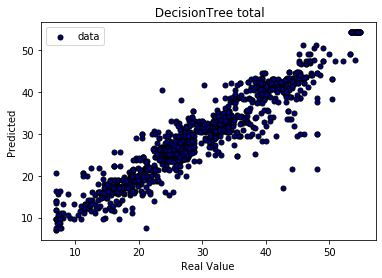

Fitting 5 folds for each of 44 candidates, totalling 220 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 220 out of 220 | elapsed:    1.8s finished


{'ccp_alpha': 0.002, 'min_samples_leaf': 10}
Test
MAE : 2.1269609591347463 | RMSE : 3.2092963334920963 | R2 : 0.8440112434007879
Train
MAE : 1.5698875496394042 | RMSE : 2.3398197053016996 | R2 : 0.9170351525615923


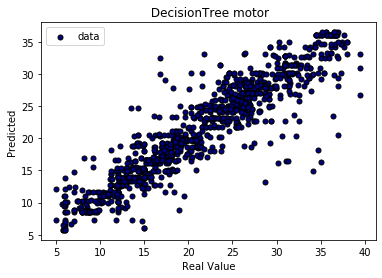

In [128]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
param_grid =  {
    'ccp_alpha': [0.0002,0.0004,0.0006,0.0008,0.0010,0.0012,0.0014,0.0016,0.0018,0.002,0.001],
    'min_samples_leaf': [1,2,5,10]
}
rf =  DecisionTreeRegressor()
kf = KFold(n_splits=5, random_state=SEED)
# Instantiate the grid search model
gsc = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = kf, n_jobs = -1, verbose = 2)
grid_result = gsc.fit(X_train_total,y_train_total)
best_params = grid_result.best_params_
best_svr = DecisionTreeRegressor(ccp_alpha=best_params["ccp_alpha"],min_samples_leaf=best_params['min_samples_leaf'])
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_total,y_train_total, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_total)
best_svr.fit(X_train_total,y_train_total)
y_1 = best_svr.predict(X_test_total)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of Decision Tree on PCA data : Total", X_train_total, y_train_total, cv=5)

plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title(" DecisionTree total")
plt.legend(loc="best")
plt.show()

from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
param_grid =  {
    'ccp_alpha': [0.0002,0.0004,0.0006,0.0008,0.0010,0.0012,0.0014,0.0016,0.0018,0.002,0.001],
    'min_samples_leaf': [1,2,5,10]
}
rf =  DecisionTreeRegressor()
kf = KFold(n_splits=5, random_state=SEED)
# Instantiate the grid search model
gsc = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = kf, n_jobs = -1, verbose = 2)
grid_result = gsc.fit(X_train_motor,y_train_motor)
best_params = grid_result.best_params_
best_svr = DecisionTreeRegressor(ccp_alpha=best_params["ccp_alpha"],min_samples_leaf=best_params['min_samples_leaf'])
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_motor,y_train_motor, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_motor)
best_svr.fit(X_train_motor,y_train_motor)
y_1 = best_svr.predict(X_test_motor)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of Decision Tree on PCA data : Motor", X_train_motor, y_train_motor, cv=5)

plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title(" DecisionTree motor")
plt.legend(loc="best")
plt.show()

# Decision Tree: original

Fitting 5 folds for each of 44 candidates, totalling 220 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 220 out of 220 | elapsed:    2.9s finished


{'ccp_alpha': 0.002, 'min_samples_leaf': 10}
Test
MAE : 2.7088975356708507 | RMSE : 4.135943338602455 | R2 : 0.8505775010189127
Train
MAE : 1.8930839828011188 | RMSE : 2.879007804395307 | R2 : 0.9277527199410625


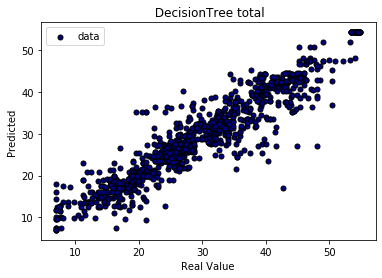

Fitting 5 folds for each of 44 candidates, totalling 220 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 220 out of 220 | elapsed:    3.1s finished


{'ccp_alpha': 0.002, 'min_samples_leaf': 10}
Test
MAE : 2.2682446720952494 | RMSE : 3.463388991826143 | R2 : 0.8179120257347329
Train
MAE : 1.5921957512109817 | RMSE : 2.410386471641703 | R2 : 0.9119433456495173


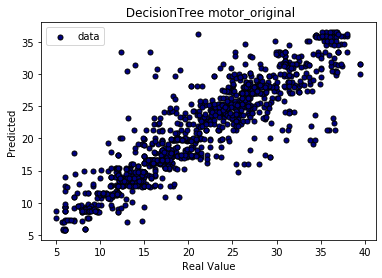

In [129]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
param_grid =  {
    'ccp_alpha': [0.0002,0.0004,0.0006,0.0008,0.0010,0.0012,0.0014,0.0016,0.0018,0.002,0.001],
    'min_samples_leaf': [1,2,5,10]
}
rf =  DecisionTreeRegressor()
kf = KFold(n_splits=5, random_state=SEED)
# Instantiate the grid search model
gsc = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = kf, n_jobs = -1, verbose = 2)
grid_result = gsc.fit(X_train_total_original,y_train_total_original)
best_params = grid_result.best_params_
best_svr = DecisionTreeRegressor(ccp_alpha=best_params["ccp_alpha"],min_samples_leaf=best_params['min_samples_leaf'])
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_total_original,y_train_total_original, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_total_original)
best_svr.fit(X_train_total_original,y_train_total_original)
y_1 = best_svr.predict(X_test_total_original)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of Decision Tree on PCA data : Total", X_train_total, y_train_total, cv=5)
plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title(" DecisionTree total")
plt.legend(loc="best")
plt.show()

from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
param_grid =  {'ccp_alpha': [0.0002,0.0004,0.0006,0.0008,0.0010,0.0012,0.0014,0.0016,0.0018,0.002,0.001],'min_samples_leaf': [1,2,5,10]}
rf =  DecisionTreeRegressor()
kf = KFold(n_splits=5, random_state=SEED)
# Instantiate the grid search model
gsc = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = kf, n_jobs = -1, verbose = 2)
grid_result = gsc.fit(X_train_motor_original,y_train_motor_original)
best_params = grid_result.best_params_
best_svr = DecisionTreeRegressor(ccp_alpha=best_params["ccp_alpha"],min_samples_leaf=best_params['min_samples_leaf'])
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_motor_original,y_train_motor_original, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_motor_original)
best_svr.fit(X_train_motor_original,y_train_motor_original)
y_1 = best_svr.predict(X_test_motor_original)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of Decision Tree on PCA data : Motor", X_train_motor, y_train_motor, cv=5)

plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title(" DecisionTree motor_original")
plt.legend(loc="best")
plt.show()

# Random Forest Regression:MOTOR

Random forest is a Supervised Learning algorithm which uses ensemble learning method for classification and regression.

Random forest is a bagging technique and not a boosting technique. 
The trees in random forests are run in parallel.

There is no interaction between these trees while building the trees.

It operates by constructing a multitude of decision trees at training time and outputting the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees.

A random forest is a meta-estimator (i.e. it combines the result of multiple predictions) which aggregates many decision trees, with some helpful modifications:
The number of features that can be split on at each node is limited to some percentage of the total (which is known as the hyperparameter). This ensures that the ensemble model does not rely too heavily on any individual feature, and makes fair use of all potentially predictive features.

Each tree draws a random sample from the original data set when generating its splits, adding a further element of randomness that prevents overfitting (bootstrap).

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed: 15.0min finished


{'bootstrap': True, 'max_features': 7, 'min_samples_leaf': 1, 'n_estimators': 2000}
Test
MAE : 1.8823583608510623 | RMSE : 2.67778992786683 | R2 : 0.8911197209238377
Train
MAE : 0.6922749707898961 | RMSE : 0.9901422545545999 | R2 : 0.9851521102729501


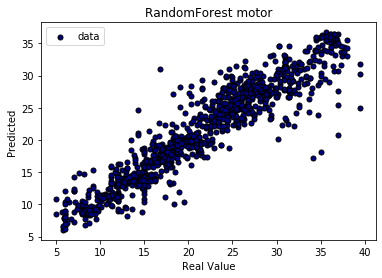

Fitting 5 folds for each of 64 candidates, totalling 320 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   54.9s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 320 out of 320 | elapsed: 17.2min finished


{'bootstrap': True, 'max_features': 14, 'min_samples_leaf': 1, 'n_estimators': 800}
Test
MAE : 1.9375282793882995 | RMSE : 2.646512055119053 | R2 : 0.893744486924126
Train
MAE : 0.7154104738231399 | RMSE : 0.9807870213117991 | R2 : 0.9854310115287106


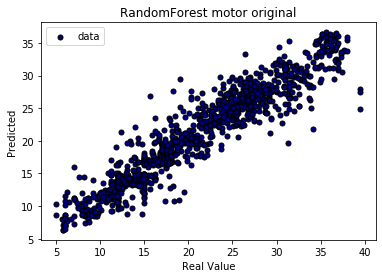

In [107]:
param_grid = {
    'bootstrap': [True],
    'max_features': [3,5,7],
    'n_estimators': [500,800,1000,2000],
    
    'min_samples_leaf': [1,2,5,10]
}
# Create a based model
rf = RandomForestRegressor(oob_score=True)
kf = KFold(n_splits=5, random_state=SEED)
# Instantiate the grid search model
gsc = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = kf, n_jobs = -1, verbose = 2)
# print(grid_search.best_params_)
# scores = cross_val_score(grid_search, X_train_motor, y_train_motor, cv=kf,scoring = 'r2')
# grid_search.fit(X_train, y_train)
# grid_search.score(X_test_motor, y_test_motor)

from sklearn.model_selection import GridSearchCV

grid_result = gsc.fit(X_train_motor,y_train_motor)
best_params = grid_result.best_params_
best_svr = RandomForestRegressor(oob_score=True, max_features=best_params["max_features"],min_samples_leaf=best_params['min_samples_leaf'],
                n_estimators=best_params["n_estimators"]
                   )
print(best_params),
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_motor,y_train_motor, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_motor)
best_svr.fit(X_train_motor,y_train_motor)
y_1 = best_svr.predict(X_test_motor)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of Random Forest Regression on PCA data : Motor", X_train_motor, y_train_motor, cv=5)
plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title("RandomForest motor")
plt.legend(loc="best")
plt.show()

param_grid = {
    'bootstrap': [True],
    'max_features': [3,4,7,14],
    'n_estimators': [500,800,1000,2000],
    
    'min_samples_leaf': [1,2,5,10]
}
# Create a based model
rf = RandomForestRegressor(oob_score=True)
kf = KFold(n_splits=5, random_state=SEED)
# Instantiate the grid search model
gsc = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = kf, n_jobs = -1, verbose = 2)
# print(grid_search.best_params_)
# scores = cross_val_score(grid_search, X_train_motor, y_train_motor, cv=kf,scoring = 'r2')
# grid_search.fit(X_train, y_train)
# grid_search.score(X_test_motor, y_test_motor)

from sklearn.model_selection import GridSearchCV

grid_result = gsc.fit(X_train_motor_original,y_train_motor_original)
best_params = grid_result.best_params_
best_svr = RandomForestRegressor(oob_score=True, max_features=best_params["max_features"],min_samples_leaf=best_params['min_samples_leaf'],
                n_estimators=best_params["n_estimators"]
                   )
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_motor_original,y_train_motor_original, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_motor_original)
best_svr.fit(X_train_motor_original,y_train_motor_original)
y_1 = best_svr.predict(X_test_motor_original)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of Random Forest Regression on original data : Motor", X_train_motor_original, y_train_motor_original, cv=5)
plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title("RandomForest motor original")
plt.legend(loc="best")
plt.show()

# Random Forest Regression:TOTAL

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   44.2s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:  8.6min finished


{'bootstrap': True, 'max_features': 7, 'min_samples_leaf': 1, 'n_estimators': 500}
Test
MAE : 2.306050370127659 | RMSE : 3.2376539762918553 | R2 : 0.9082582303838306
Train
MAE : 0.8565851440212777 | RMSE : 1.20725669353386 | R2 : 0.9873015246261329


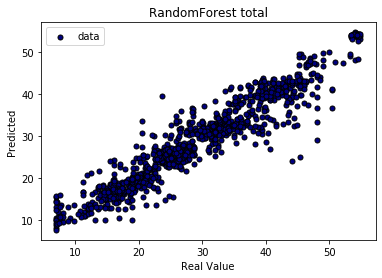

Fitting 5 folds for each of 64 candidates, totalling 320 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   53.0s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 320 out of 320 | elapsed: 17.1min finished


{'bootstrap': True, 'max_features': 14, 'min_samples_leaf': 1, 'n_estimators': 2000}
Test
MAE : 2.354119481265946 | RMSE : 3.2082627668309107 | R2 : 0.9099476775004112
Train
MAE : 0.8693662403271192 | RMSE : 1.1846440450881937 | R2 : 0.9877735846882636


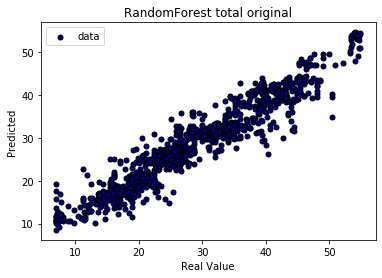

In [108]:
param_grid = {
    'bootstrap': [True],
    'max_features': [3,5,7],
    'n_estimators': [500,800,1000,2000],
    
    'min_samples_leaf': [1,2,5,10]
}
# Create a based model
rf = RandomForestRegressor(oob_score=True)
kf = KFold(n_splits=5, random_state=SEED)
# Instantiate the grid search model
gsc = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = kf, n_jobs = -1, verbose = 2)
# print(grid_search.best_params_)
# scores = cross_val_score(grid_search, X_train_motor, y_train_motor, cv=kf,scoring = 'r2')
# grid_search.fit(X_train, y_train)
# grid_search.score(X_test_motor, y_test_motor)

from sklearn.model_selection import GridSearchCV

grid_result = gsc.fit(X_train_total,y_train_total)
best_params = grid_result.best_params_
best_svr = RandomForestRegressor(oob_score=True, max_features=best_params["max_features"],min_samples_leaf=best_params['min_samples_leaf'],
                n_estimators=best_params["n_estimators"]
                   )
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_total,y_train_total, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_total)
best_svr.fit(X_train_total,y_train_total)
y_1 = best_svr.predict(X_test_total)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of Random Forest Regression on PCA data : Total", X_train_total, y_train_total, cv=5)
plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title("RandomForest total")
plt.legend(loc="best")
plt.show()
param_grid = {
    'bootstrap': [True],
    'max_features': [3,4,7,14],
    'n_estimators': [500,800,1000,2000],
    
    'min_samples_leaf': [1,2,5,10]
}
# Create a based model
rf = RandomForestRegressor(oob_score=True,)
kf = KFold(n_splits=5, random_state=SEED)
# Instantiate the grid search model
gsc = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = kf, n_jobs = -1, verbose = 2)
# print(grid_search.best_params_)
# scores = cross_val_score(grid_search, X_train_motor, y_train_motor, cv=kf,scoring = 'r2')
# grid_search.fit(X_train, y_train)
# grid_search.score(X_test_motor, y_test_motor)

from sklearn.model_selection import GridSearchCV

grid_result = gsc.fit(X_train_total_original,y_train_total_original)
best_params = grid_result.best_params_
best_svr = RandomForestRegressor(oob_score=True, max_features=best_params["max_features"],min_samples_leaf=best_params['min_samples_leaf'],
                n_estimators=best_params["n_estimators"]
                   )
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_total_original,y_train_total_original, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_total_original)
best_svr.fit(X_train_total_original,y_train_total_original)
y_1 = best_svr.predict(X_test_total_original)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of Random Forest Regression on original data : Total", X_train_total_original, y_train_total_original, cv=5)
plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title("RandomForest total original")
plt.legend(loc="best")
plt.show()

# SVR:MOTOR

The Support Vector Regression (SVR) uses a margin of tolerance (epsilon) which is set in approximation to the SVM which would have already requested from the problem.
The main idea is the same of the classificator: to minimize error, 
individualizing the hyperplane which maximizes the margin, keeping in mind that part of the error is tolerated. 
The kernel functions transform the data into a higher dimensional feature space to make it possible to perform the linear separation, we have decided to use immediately a kernel because we noticed in a previous regression that was not the right path to follow.


Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   36.7s finished


{'C': 32, 'epsilon': 0.8, 'gamma': 0.4}
[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]Test
MAE : 2.4088665905628597 | RMSE : 3.3571790612716166 | R2 : 0.8287481408584441
Train
MAE : 1.223906552452532 | RMSE : 1.9185704376160702 | R2 : 0.9442544232599828
[LibSVM]

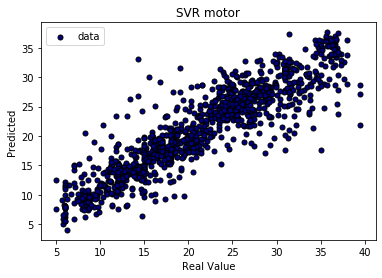

train set dimension
(4700, 7)
SVR support vector
(3373, 7)
Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   27.8s finished


{'C': 64, 'epsilon': 1, 'gamma': 0.4}
[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]Test
MAE : 2.060110249779508 | RMSE : 2.8359210981705822 | R2 : 0.8778433630195066
Train
MAE : 1.2571449711079705 | RMSE : 1.7527366073675588 | R2 : 0.9534798323241958
[LibSVM]

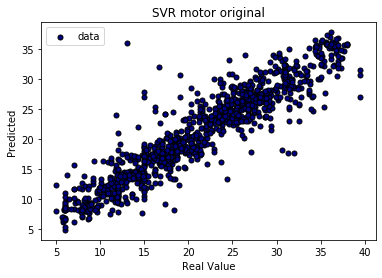

train set dimension
(4700, 17)
SVR support vector
(2990, 17)


In [44]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
gsc = GridSearchCV(
        estimator=SVR(kernel='rbf'),
        param_grid={
            'C': [32,64],
            'epsilon': [0.6,0.8,1],
            'gamma': [0.2,0.4]
        },
        cv=5, scoring='r2', verbose = 2, n_jobs=-1)
grid_result = gsc.fit(X_train_motor,y_train_motor)
best_params = grid_result.best_params_
best_svr = SVR(kernel='rbf', C=best_params["C"], epsilon=best_params["epsilon"], gamma=best_params["gamma"],
                   coef0=0.1, shrinking=True,
                   tol=0.001, cache_size=200, verbose=True, max_iter=-1)
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_motor,y_train_motor, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_motor)
best_svr.fit(X_train_motor,y_train_motor)
y_1 = best_svr.predict(X_test_motor)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of SVR on PCA data : Motor", X_train_motor, y_train_motor, cv=5)

plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title("SVR motor")
plt.legend(loc="best")
plt.show()
print('train set dimension')
print(X_train_motor.shape)

print('SVR support vector')
print(best_svr.support_vectors_.shape)
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
gsc = GridSearchCV(
        estimator=SVR(kernel='rbf'),
        param_grid={
            'C': [32,64],
            'epsilon': [0.6,0.8,1],
            'gamma': [0.2,0.4]
        },
        cv=5, scoring='r2', verbose = 2, n_jobs=-1)
grid_result = gsc.fit(X_train_motor_original,y_train_motor_original)
best_params = grid_result.best_params_
best_svr = SVR(kernel='rbf', C=best_params["C"], epsilon=best_params["epsilon"], gamma=best_params["gamma"],
                   coef0=0.1, shrinking=True,
                   tol=0.001, cache_size=200, verbose=True, max_iter=-1)
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_motor_original,y_train_motor_original, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_motor_original)
best_svr.fit(X_train_motor_original,y_train_motor_original)
y_1 = best_svr.predict(X_test_motor_original)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of SVR on original data : Motor", X_train_motor_original, y_train_motor_original, cv=5)

plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title("SVR motor original")
plt.legend(loc="best")
plt.show()
print('train set dimension')
print(X_train_motor_original.shape)

print('SVR support vector')
print(best_svr.support_vectors_.shape)

# SVR: TOTAL

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   36.6s finished


{'C': 32, 'epsilon': 1, 'gamma': 0.4}
[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]Test
MAE : 3.0020173974494595 | RMSE : 4.184702704738328 | R2 : 0.8467240886762151
Train
MAE : 1.5813117367767624 | RMSE : 2.434771951290014 | R2 : 0.948353027679633
[LibSVM]

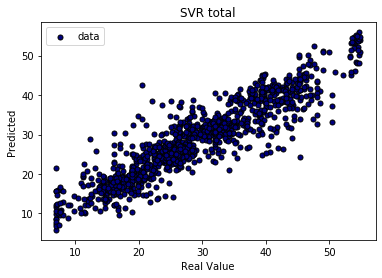

train set dimension
(4700, 7)
SVR support vector
(3414, 7)
Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   24.6s finished


{'C': 64, 'epsilon': 1, 'gamma': 0.4}
[LibSVM][LibSVM][LibSVM][LibSVM][LibSVM]Test
MAE : 2.060110249779508 | RMSE : 2.8359210981705822 | R2 : 0.8778433630195066
Train
MAE : 1.2571449711079705 | RMSE : 1.7527366073675588 | R2 : 0.9534798323241958
[LibSVM]

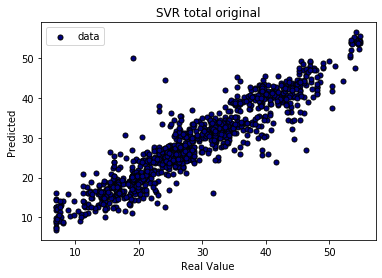

train set dimension
(4700, 7)
SVR support vector
(3294, 17)


In [45]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
gsc = GridSearchCV(
        estimator=SVR(kernel='rbf'),
        param_grid={
            'C': [32,64],
            'epsilon': [0.6,0.8,1],
            'gamma': [0.2,0.4]
        },
        cv=5, scoring='r2', verbose = 2, n_jobs=-1)
grid_result = gsc.fit(X_train_total,y_train_total)
best_params = grid_result.best_params_
best_svr = SVR(kernel='rbf', C=best_params["C"], epsilon=best_params["epsilon"], gamma=best_params["gamma"],
                   coef0=0.1, shrinking=True,
                   tol=0.001, cache_size=200, verbose=True, max_iter=-1)
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_total,y_train_total, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_total)
best_svr.fit(X_train_total,y_train_total)
y_1 = best_svr.predict(X_test_total)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of SVR on PCA data : Total", X_train_total, y_train_total, cv=5)

plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title("SVR total")
plt.legend(loc="best")
plt.show()
print('train set dimension')
print(X_train_total.shape)

print('SVR support vector')
print(best_svr.support_vectors_.shape)
gsc = GridSearchCV(
        estimator=SVR(kernel='rbf'),
        param_grid={
            'C': [32,64],
            'epsilon': [0.6,0.8,1],
            'gamma': [0.2,0.4]
        },
        cv=5, scoring='r2', verbose = 2, n_jobs=-1)
grid_result = gsc.fit(X_train_total_original,y_train_total_original)
best_params = grid_result.best_params_
best_svr = SVR(kernel='rbf', C=best_params["C"], epsilon=best_params["epsilon"], gamma=best_params["gamma"],
                   coef0=0.1, shrinking=True,
                   tol=0.001, cache_size=200, verbose=True, max_iter=-1)
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}

scores = cross_validate(best_svr, X_train_motor_original,y_train_motor_original, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_total_original)
best_svr.fit(X_train_total_original,y_train_total_original)
y_1 = best_svr.predict(X_test_total_original)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of SVR on original data : Total", X_train_total_original, y_train_total_original, cv=5)

plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title("SVR total original")
plt.legend(loc="best")
plt.show()
print('train set dimension')
print(X_train_total.shape)

print('SVR support vector')
print(best_svr.support_vectors_.shape)

# KN Regressor : PCA

K nearest neighbors is a simple algorithm that stores all available cases and predict the numerical target based on a similarity measure (e.g., distance functions).

A simple implementation of KNN regression is to calculate the average of the numerical target of the K nearest neighbors. 
Another approach uses an inverse distance weighted average of the K nearest neighbors. KNN regression uses the same distance functions as KNN classification.

Fitting 5 folds for each of 98 candidates, totalling 490 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 490 out of 490 | elapsed:    2.9s finished


{'n_neighbors': 4, 'weights': 'distance'}
Test
MAE : 2.8799739418612296 | RMSE : 4.160271929383205 | R2 : 0.8484837636027089
Train
MAE : 0.0 | RMSE : 0.0 | R2 : 1.0


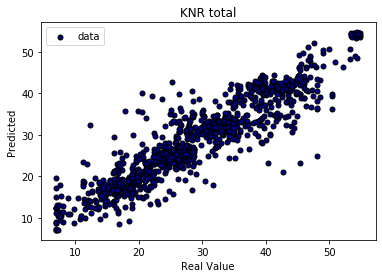

Fitting 5 folds for each of 98 candidates, totalling 490 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 106 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 490 out of 490 | elapsed:    2.9s finished


{'n_neighbors': 4, 'weights': 'distance'}
Test
MAE : 2.2966724374984007 | RMSE : 3.3342658119178723 | R2 : 0.8311093013827084
Train
MAE : 0.0 | RMSE : 0.0 | R2 : 1.0


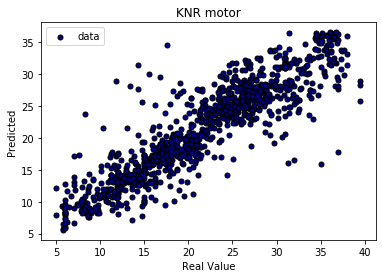

In [111]:
from sklearn.model_selection import GridSearchCV

param_grid = {'n_neighbors':range(1,50),'weights':['uniform','distance']}
rf =  KNeighborsRegressor()
kf = KFold(n_splits=5, random_state=SEED)
# Instantiate the grid search model
gsc = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = kf, n_jobs = -1, verbose = 2)
grid_result = gsc.fit(X_train_total,y_train_total)
best_params = grid_result.best_params_
best_svr = KNeighborsRegressor( n_neighbors=best_params["n_neighbors"],weights=best_params['weights']
                   )
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_total,y_train_total, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_total)
best_svr.fit(X_train_total,y_train_total)
y_1 = best_svr.predict(X_test_total)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of KNR on PCA data : Total", X_train_total, y_train_total, cv=5)

plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title("KNR total")
plt.legend(loc="best")
plt.show()

from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
param_grid = {'n_neighbors':range(1,50),'weights':['uniform','distance']}
rf =  KNeighborsRegressor()
kf = KFold(n_splits=5, random_state=SEED)
# Instantiate the grid search model
gsc = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = kf, n_jobs = -1, verbose = 2)
grid_result = gsc.fit(X_train_motor,y_train_motor)
best_params = grid_result.best_params_
best_svr = KNeighborsRegressor( n_neighbors=best_params["n_neighbors"],weights=best_params['weights']
                   )
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_motor,y_train_motor, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_motor)
best_svr.fit(X_train_motor,y_train_motor)
y_1 = best_svr.predict(X_test_motor)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of KNR on PCA data : Motor", X_train_motor, y_train_motor, cv=5)

plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title("KNR motor")
plt.legend(loc="best")
plt.show()

# KN Regressor : original

Fitting 5 folds for each of 98 candidates, totalling 490 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 490 out of 490 | elapsed:    4.0s finished


{'n_neighbors': 5, 'weights': 'distance'}
Test
MAE : 2.6225815864636606 | RMSE : 3.729897665409646 | R2 : 0.8777970758937915
Train
MAE : 0.0 | RMSE : 0.0 | R2 : 1.0


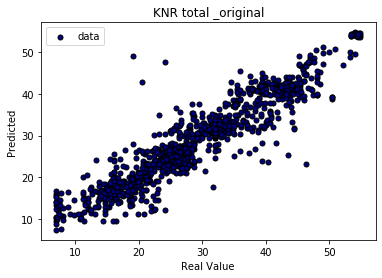

Fitting 5 folds for each of 98 candidates, totalling 490 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  70 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 490 out of 490 | elapsed:    4.0s finished


{'n_neighbors': 5, 'weights': 'distance'}
Test
MAE : 2.0836411864843973 | RMSE : 2.965496906957699 | R2 : 0.8662579278210844
Train
MAE : 0.0 | RMSE : 0.0 | R2 : 1.0


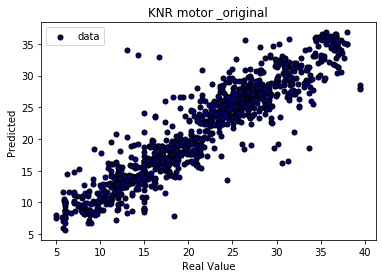

In [112]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
param_grid = {'n_neighbors':range(1,50),'weights':['uniform','distance']}
rf =  KNeighborsRegressor()
kf = KFold(n_splits=5, random_state=SEED)
# Instantiate the grid search model
gsc = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = kf, n_jobs = -1, verbose = 2)
grid_result = gsc.fit(X_train_total_original,y_train_total_original)
best_params = grid_result.best_params_
best_svr = KNeighborsRegressor( n_neighbors=best_params["n_neighbors"],weights=best_params['weights']
                   )
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_total_original,y_train_total_original, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_total_original)
best_svr.fit(X_train_total_original,y_train_total_original)
y_1 = best_svr.predict(X_test_total_original)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of KNR on PCA data : Total", X_train_total, y_train_total, cv=5)

plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title("KNR total _original")
plt.legend(loc="best")
plt.show()

from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
param_grid = {'n_neighbors':range(1,50),'weights':['uniform','distance']}
rf =  KNeighborsRegressor()
kf = KFold(n_splits=5, random_state=SEED)
# Instantiate the grid search model
gsc = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = kf, n_jobs = -1, verbose = 2)
grid_result = gsc.fit(X_train_motor_original,y_train_motor_original)
best_params = grid_result.best_params_
best_svr = KNeighborsRegressor( n_neighbors=best_params["n_neighbors"],weights=best_params['weights']
                   )
print(best_params)
scoring = {
               'abs_error': 'neg_mean_absolute_error',
               'squared_error': 'neg_mean_squared_error',
                'r2':'r2'}
from sklearn.model_selection import cross_validate
import math
scores = cross_validate(best_svr, X_train_motor_original,y_train_motor_original, cv=5, scoring=scoring, return_train_score=True)
print('Test')
print("MAE :", abs(scores['test_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['test_squared_error'].mean())), "| R2 :", (scores['test_r2'].mean()))
print('Train')
print("MAE :", abs(scores['train_abs_error'].mean()), "| RMSE :", math.sqrt(abs(scores['train_squared_error'].mean())), "| R2 :", (scores['train_r2'].mean()))
y = np.array( y_test_motor_original)
best_svr.fit(X_train_motor_original,y_train_motor_original)
y_1 = best_svr.predict(X_test_motor_original)
# y_2 = regr_2.predict(X_test_total)
# y_3 = regr_3.predict(X_test_total)

# Plot the results
plt.figure()
s = 25
plt.scatter(y[:, 0], y_1, c="navy", s=s,
            edgecolor="black", label="data")
# plt.scatter(y_1[:, 0], y_1[:, 1], c="cornflowerblue", s=s,
#             edgecolor="black", label="grid search best")
# plt.scatter(y_2[:, 0], y_2[:, 1], c="red", s=s,
#             edgecolor="black", label="max_depth=5")
# plt.scatter(y_3[:, 0], y_3[:, 1], c="orange", s=s,
#             edgecolor="black", label="max_depth=8")
colors = plotly.colors.DEFAULT_PLOTLY_COLORS
plot_learning_curve(grid_result.best_estimator_, "Learning Curve of KNR on PCA data : Motor", X_train_motor, y_train_motor, cv=5)

plt.xlabel("Real Value")
plt.ylabel("Predicted")
plt.title("KNR motor _original")
plt.legend(loc="best")
plt.show()